# Assignment 1: Data Parsing, Cleansing and Integration
## Task 1 and 2
#### Student Name: Mashal Khan
#### Student ID: 3906303

Date: XXXX

Version: 1.0

Environment: Python 3 and Jupyter notebook

Libraries used: please include the main libraries you used in your assignment, e.g.,:
* pandas
* re
* numpy
* element tree
* matplotlib
* seaborn

## Introduction
QUICK NOTE: Apologies... this notebook itself can take up to 40 minutes to fully run, on a i7-11800h.

This is a data analysis of job listings from various UK job listing websites. It was found that there was incomplete and inconsistent data in this dataset, and statsitical analysis and population research was used to fill some of the gaps in the missing or inaccurate data.

Luckily, there were only few problems in the dataset. Elements in the XML data file weren't stored on all position entries. Missing value formats were inconsistent across many data columns. And data was also very inconsistent on the salary column. And we've also had to deal with missing data values on important attributes like Salary. 

There was also found some data recorded that was contradictory  or nonsensical, so we dealt with them by removing outliers.

However, we have used the appropriate tools to address those problems. Including libraries like element tree, regex and seaborn.

## Importing libraries 

In [1]:
import numpy as np
import pandas as pd
import re
from IPython.display import display

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns

# Configure visualisations
%matplotlib inline
mpl.style.use('ggplot')

## Task 1. Parsing Data

### 1.1. Examining and loading data
Examine "\<student\_id\>_dataset1.xml" to determine its content and structure, then load it into Python. Explain your findings here, e.g., how are the records are stored? 

In [2]:
import xml.etree.ElementTree as etree    
tree = etree.parse("s3906303_dataset1.xml")  

We will examine this XML files size from the output below

In [3]:
# Code to inspect the provided data file
# Couple of notes for all code block in this notebook
## please provide proper comment on your code
## Please re-start and run all cells to make sure codes are runable and include your output in the submission

root = tree.getroot()     
for child in root[0:10]:           
    print(child,len(child))

<Element 'Source' at 0x000001B9A9C2F360> 9225
<Element 'Source' at 0x000001B9AAC1DCC0> 181
<Element 'Source' at 0x000001B9AAC6CE00> 7161
<Element 'Source' at 0x000001B9AB9CE450> 2871
<Element 'Source' at 0x000001B9ABEC29A0> 185
<Element 'Source' at 0x000001B9ABF1CE50> 2537
<Element 'Source' at 0x000001B9AC408860> 3315
<Element 'Source' at 0x000001B9ACA3B400> 1800
<Element 'Source' at 0x000001B9ACDB0A90> 1143
<Element 'Source' at 0x000001B9ACF87450> 297


In [4]:
set([child.tag for child in root[0]])

{'Name', 'Position'}

Now we try to find the pattern in the XML file structure, using recursion.

In [5]:
def findchilds(root):
    if len(root) == 0:
        return
    for child in root:
        print(child.tag)
        findchilds(child)
        
findchilds(root[0])

Name
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contra

Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Lo

Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Loca

Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date

Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Sa

Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTim

Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date

Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
T

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date


Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date


Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Cate

Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contra

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date

We can see the pattern of element attributes are mainly Position, Id, Title, Location, Company, ContractTime, Category, Salary, Date.

We can also find all possible element tags in the xml file here:

In [6]:
elementset = set()
def findchildset(root):
    if len(root) == 0:
        return
    for child in root:
        elementset.add(child.tag)
        findchilds(child)
        
findchildset(root)
print(elementset)

Name
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
C

Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Cate

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date


ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
C

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category


Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Cate

Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Loca

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
T

Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Da

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
C

Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Categ

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTim

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Lo

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
C

Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Loca

Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Sa

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Ca

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
C

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Sala

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Ca

Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Categ

Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Categ

Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Name
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date


Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Posi

Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Posi

Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType

Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id


Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractT

Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category


ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date


ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Position
Id
Title
Location
Company
Category
Salary
Date
Positi

Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
Contract

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary


ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Posi

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Cat

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Name
Position
Id
Title
Location
Category
Salary
Date
Position
Id
Title
Location
Category
Salary
Date
Position
Id
Title
Location
Category
Salary
Date
Position
Id
Title
Location
Category
Salary
Date
Position
Id
Title
Location
Category
Salary
Date
Position
Id
Title
Location
Category
Salary
Date
Position
Id
Title
Location
Cat

Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Date
Position
Id
T

Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractT

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Co

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Name
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTim

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Locatio

Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id

Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Name
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id
Title
Location
ContractType
Category
Salary
Date
Position
Id
Title
Location
ContractTime
Category
Salary
Date
Position
Id

Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Name
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Sa

Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
C

Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Titl

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractTime
Category
Salary
Date
Position
Id
Title
Loca

ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
ContractTime
Category
Salary
Date
Position
Id
Title
Location
Company
ContractType
Con

Here we take a look at a sample of the stored data and examine the attributes of the elements. We find only date elements have attributes.

In [7]:
def findchilddata(root):
    if len(root) == 0:
        return
    for child in root:
        print(child.tag,child.text,child.attrib)
        findchilddata(child)
        
findchilddata(root[0][0:50])

Name totaljobs.com {}
Position 
 {}
Id 71674910 {}
Title Investor Relations Opportunities {}
Location South East London {}
Company Michael Page Finance {}
ContractTime permanent {}
Category Accounting & Finance Jobs {}
Salary 95000 {}
Date None {'Open': '20131028T120000', 'Close': '20131227T120000'}
Position 
 {}
Id 72447762 {}
Title Regional Services Manager Learning Disabilities {}
Location Nottinghamshire {}
Company Social Care {}
ContractTime permanent {}
Category Healthcare & Nursing Jobs {}
Salary 29202 {}
Date None {'Open': '20130210T120000', 'Close': '20130312T120000'}
Position 
 {}
Id 71428642 {}
Title Manager of Commercial Tendering / Proposals {}
Location Warwickshire {}
Company Hays {}
ContractTime permanent {}
Category Engineering Jobs {}
Salary 43500 {}
Date None {'Open': '20120326T120000', 'Close': '20120525T120000'}
Position 
 {}
Id 68071466 {}
Title C Winforms Developer, WPF  Mobile Telecommunications  London {}
Location South East London {}
Company Dawson & Walsh {}
C

In [8]:
total  = 50753

### 1.2 Parsing data into the required format

<span style="color: red"> You might have complex notebook structure in this section, please feel free to create your own notebook structure. </span>

###### Companies

In [9]:
companies = []

for elem in tree.iter(tag='Company'):
    companies.append(elem.text)
print('difference = Total - Length of data = ',total-len(companies))
companies[0:5]

difference = Total - Length of data =  408


['Michael Page Finance',
 'Social Care',
 'Hays',
 'Dawson & Walsh',
 'Kings Permanent Recruitment']

The data difference is 408, so we have to account for gaps in the data:

In [10]:
# helper function to detect None elements
def find_gaps(elem,name):
    if elem.find(name) is not None:
        return elem.find(name).text
    else:
        return 'non-specified'

In [11]:
companies = []
for elem in tree.iter(tag='Position'):
    companies.append(find_gaps(elem,'Company'))
print('difference = Total - Length of data = ',total-len(companies))
print(companies[0:5])

difference = Total - Length of data =  0
['Michael Page Finance', 'Social Care', 'Hays', 'Dawson & Walsh', 'Kings Permanent Recruitment']


###### Open Date

In [12]:
opendates = []

for elem in tree.iter(tag='Position'):
    opendates.append(elem.find('Date').attrib['Open'])
print('difference = Total - Length of data = ',total-len(opendates))
opendates[0:20]

difference = Total - Length of data =  0


['20131028T120000',
 '20130210T120000',
 '20120326T120000',
 '20130623T150000',
 '20120123T120000',
 '20120823T120000',
 '20120310T120000',
 '20131125T150000',
 '20121116T000000',
 '20120515T000000',
 '20120602T000000',
 '20131205T120000',
 '20121212T150000',
 '20130303T000000',
 '20130122T150000',
 '20120414T120000',
 '20120913T120000',
 '20121009T000000',
 '20130605T000000',
 '20130716T000000']

###### Close Date

In [13]:
closedates =[]
for elem in tree.iter(tag='Position'):
    closedates.append(elem.find('Date').attrib['Close'])
print('difference = Total - Length of data = ',total-len(closedates))
closedates[0:20]

difference = Total - Length of data =  0


['20131227T120000',
 '20130312T120000',
 '20120525T120000',
 '20130822T150000',
 '20120222T120000',
 '20120922T120000',
 '20120608T120000',
 '20140124T150000',
 '20121216T000000',
 '20120714T000000',
 '20120831T000000',
 '20140203T120000',
 '20130312T150000',
 '20130317T000000',
 '20130205T150000',
 '20120428T120000',
 '20121013T120000',
 '20121208T000000',
 '20130804T000000',
 '20131014T000000']

###### Salary

In [14]:
salaries = []

for elem in tree.iter(tag='Position'):
    salaries.append(find_gaps(elem,'Salary'))
print('difference = Total - Length of data = ',total-len(salaries))
salaries[0:20]

difference = Total - Length of data =  0


['95000',
 '29202',
 '43500',
 '40000',
 '20500',
 '40000',
 '25000',
 '42500',
 '52500',
 '22000',
 '35000',
 '18000',
 '24000',
 '29400',
 '84000',
 '38400',
 '14880',
 '19000',
 '51000',
 '46000']

###### Category

In [15]:
categories = []

for elem in tree.iter(tag='Position'):
    categories.append(find_gaps(elem,'Category'))
print('difference = Total - Length of data = ',total-len(categories))
categories[0:20]

difference = Total - Length of data =  0


['Accounting & Finance Jobs',
 'Healthcare & Nursing Jobs',
 'Engineering Jobs',
 'IT Jobs',
 'Sales Jobs',
 'IT Jobs',
 'IT Jobs',
 'Accounting & Finance Jobs',
 'Engineering Jobs',
 'Sales Jobs',
 'Sales Jobs',
 'PR, Advertising & Marketing Jobs',
 'IT Jobs',
 'Accounting & Finance Jobs',
 'IT Jobs',
 'Healthcare & Nursing Jobs',
 'Engineering Jobs',
 'Sales Jobs',
 'Sales Jobs',
 'IT Jobs']

###### ContractTime

In [16]:
contracttimes = []

for elem in tree.iter(tag='Position'):
    contracttimes.append(find_gaps(elem,'ContractTime'))
print('difference = Total - Length of data = ',total-len(contracttimes))
contracttimes[0:20]

difference = Total - Length of data =  0


['permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'permanent',
 'contract',
 'contract',
 'contract',
 'contract',
 'permanent',
 'permanent',
 'permanent']

###### ContractType

In [17]:
contracttypes = []

for elem in tree.iter(tag='Position'):
    contracttypes.append(find_gaps(elem,'ContractType'))
print('difference = Total - Length of data = ',total-len(contracttypes))
contracttypes[0:20]

difference = Total - Length of data =  0


['non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified',
 'non-specified']

###### Locations

In [18]:
locations = []

for elem in tree.iter(tag='Location'):
    locations.append(elem.text)
print('difference = Total - Length of data = ',total-len(locations))
locations[0:20]

difference = Total - Length of data =  0


['South East London',
 'Nottinghamshire',
 'Warwickshire',
 'South East London',
 'York',
 'UK',
 'UK',
 'UK',
 'Warrington',
 'Nottinghamshire',
 'South East London',
 'UK',
 'UK',
 'South East London',
 'South East London',
 'East Midlands',
 'Melton Mowbray',
 'UK',
 'UK',
 'East Sheen']

###### Titles

In [19]:
titles = []

for elem in tree.iter(tag='Title'):
    titles.append(elem.text)
print('difference = Total - Length of data = ',total-len(titles))
titles[0:20]

difference = Total - Length of data =  0


['Investor Relations Opportunities',
 'Regional Services Manager Learning Disabilities',
 'Manager of Commercial Tendering / Proposals',
 'C Winforms Developer, WPF  Mobile Telecommunications  London',
 'Estate Agency Sales Negotiator – Estate Agent',
 'MLearning Developers // Mobile Elearning Developers ********',
 'Junior NET Developer **** Stockport',
 'Insurance Consultant Relationship Manager',
 'Senior Safety Consultant  Warrington  ****k',
 'Management Opportunities Nottinghamshire',
 'Specification Sales  Luxury Homes Architects & Interior Designers  London',
 'Graduate Marketing Trainee, Birmingham',
 'Junior Developer (Innovative Applications)',
 'HR Assistant  Benefits & Payroll',
 'Business Analyst / Data Analyst  Agile  Contract',
 'ACT Pharmacy Technician required in the East Midlands',
 'Team Leader  Food',
 'Recruitment Resourcer  Fluent Dutch  Recruitment Delivery Resourcer',
 'Senior Relationship Manager  Financial Services',
 'Software Build Engineer  London  ****k']

###### Sources

Let us find the incomplete data:

In [20]:
from collections import Counter
sources = []

for elem in tree.iter(tag='Source'):
    for iden in elem.findall('Position/Id'):
        sources.append(elem.find('Name').text)
print('difference = Total - Length of data = ',total-len(sources))
print(set(sources))
print(Counter(sources).most_common())
print(sources[0:100])


difference = Total - Length of data =  0
{'jobs4medical.co.uk', 'emedcareers.com', 'jobsinsocialwork.co.uk', 'hotrecruit.com', 'Brand Republic Jobs', 'PR Week Jobs', 'londonjobs.co.uk', 'fish4.co.uk', 'JustLondonJobs', 'grb.uk.com', 'onlymarketingjobs.com', 'staffnurse.com', 'randstadfp.com', 'jobs.gponline.com', 'jobs.scot.nhs.uk', 'caterer.com', 'Jobs Ac', 'jobsinscotland.com', 'salestarget.co.uk', 'jobs.planningresource.co.uk', 'jobg8.com', 'ijobs', 'GAAPweb', 'gojobsearch.co.uk', 'totaljobs.com', 'cityjobs.com', 'cardandpaymentjobs.com', 'insurancejobs.co.uk', 'jobs.electronicsweekly.com', 'Jobs24', 'icaewjobs.com', 'jobs.guardian.co.uk', 'renewablescareers.com', 'jobs.bighospitality.co.uk', 'technojobs.co.uk', 'Multilingualvacancies', 'cwjobs.co.uk', 'ukstaffsearch.com', 'michaelpage.co.uk', 'frontofficebanking.com', 'securityclearedjobs.com', 'jobs.chinwag.com', 'justengineers.net', 'jobsite.co.uk', 'jobs.newstatesman.com', 'Teaching jobs - TES Connect', 'tntjobs.co.uk', 'jobsfin

###### ID's

In [21]:
# Code to parse data
ids = []

for elem in tree.iter(tag='Id'):
    ids.append(elem.text)
print('difference = Total - Length of data = ',total-len(ids))

ids[0:10]

difference = Total - Length of data =  0


['71674910',
 '72447762',
 '71428642',
 '68071466',
 '68703116',
 '71187370',
 '68672813',
 '69172189',
 '71679380',
 '68697237']

In [22]:
#helper function: method to find most common elements
def find_common(tree,name):
    uniq = []
    for elem in tree.iter(tag=name):
        uniq.append(elem.text)
    print(Counter(uniq).most_common(20))

It seems 1 ID appears twice, which is wrong. Let's fix it now, by changing it to the maximum ID number + 1

In [23]:
dataDict = {}
ids = [int(x) for x in ids]

dataDict['Id'] = ids
dataDict['Title'] = titles
dataDict['Location'] = locations
dataDict['Company'] = companies
dataDict['ContractType'] = contracttypes
dataDict['ContractTime'] = contracttimes
dataDict['Category'] = categories
dataDict['Salary'] = salaries
dataDict['OpenDate'] = opendates
dataDict['CloseDate'] = closedates
dataDict['SourceName'] = sources

df = pd.DataFrame(dataDict, index = ids)
df.index.name = 'Id'
df.drop('Id', 1, inplace = True)

df

,Title,Location,Company,ContractType,ContractTime,Category,Salary,OpenDate,CloseDate,SourceName
Id,,,,,,,,,,
71674910,Investor Relations Opportunities,South East London,Michael Page Finance,non-specified,permanent,Accounting & Finance Jobs,95000,20131028T120000,20131227T120000,totaljobs.com
72447762,Regional Services Manager Learning Disabilities,Nottinghamshire,Social Care,non-specified,permanent,Healthcare & Nursing Jobs,29202,20130210T120000,20130312T120000,totaljobs.com
71428642,Manager of Commercial Tendering / Proposals,Warwickshire,Hays,non-specified,permanent,Engineering Jobs,43500,20120326T120000,20120525T120000,totaljobs.com
68071466,"C Winforms Developer, WPF Mobile Telecommunic...",South East London,Dawson & Walsh,non-specified,permanent,IT Jobs,40000,20130623T150000,20130822T150000,totaljobs.com
68703116,Estate Agency Sales Negotiator – Estate Agent,York,Kings Permanent Recruitment,non-specified,permanent,Sales Jobs,20500,20120123T120000,20120222T120000,totaljobs.com
...,...,...,...,...,...,...,...,...,...,...
66372417,Graduate Engineer (Water industry),South Lanarkshire,Carrington West Limited,full_time,contract,Engineering Jobs,,20130119T000000,20130419T000000,thegraduate.co.uk
70139229,Health & Social Care Tutor/Assessor Bristol,UK,Pursuit Training Ltd,N/A,permanent,Teaching Jobs,N/A,20120811T000000,20121010T000000,cvjobstore.com
66928165,MOD GP Locum – Berkshire,Berkshire,Your World Healthcare UK,part_time,contract,Healthcare & Nursing Jobs,59040,20120625T150000,20120725T150000,jobs.gponline.com


......

## Task 2. Auditing and cleansing the loaded data

Here, you should write your own code to audit data, identify data problems and to fix them. You are also required to record the errors found and fixings in an error list.

<span style="color: red"> You might have complex notebook structure in this section, please feel free to create your own notebook structure. </span>

### Here we create a errorlist for our handled errors:

In [24]:
itemlist = ['indexOfdf','ColumnName', 'Orignal', 'Modified', 'ErrorType','Fixing']
erlist = pd.DataFrame(columns=itemlist)
erlist

,indexOfdf,ColumnName,Orignal,Modified,ErrorType,Fixing


In [25]:
def updateErlist(indexOfdf, ColumnName, Orignal, Modified, ErrorType, Fixing):
    errItem=[indexOfdf,ColumnName, Orignal, Modified, ErrorType,Fixing]
    erlist.loc[len(erlist)]=errItem

In [26]:
indices = df.index 
indices

Int64Index([71674910, 72447762, 71428642, 68071466, 68703116, 71187370,
            68672813, 69172189, 71679380, 68697237,
            ...
            69035766, 69035795, 69035689, 69035598, 68227570, 66372417,
            70139229, 66928165, 69693532, 71478475],
           dtype='int64', name='Id', length=50753)

### Observations

In [27]:
df.shape

(50753, 10)

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50753 entries, 71674910 to 71478475
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Title         50753 non-null  object
 1   Location      50753 non-null  object
 2   Company       50753 non-null  object
 3   ContractType  50753 non-null  object
 4   ContractTime  50753 non-null  object
 5   Category      50753 non-null  object
 6   Salary        50753 non-null  object
 7   OpenDate      50753 non-null  object
 8   CloseDate     50753 non-null  object
 9   SourceName    50753 non-null  object
dtypes: object(10)
memory usage: 4.3+ MB


## Fixing missing data

In [29]:
df.describe()

,Title,Location,Company,ContractType,ContractTime,Category,Salary,OpenDate,CloseDate,SourceName
count,50753,50753,50753,50753,50753,50753,50753,50753,50753,50753
unique,50750,496,8775,6,6,8,3426,2194,2417,107
top,Quality Assurance/Software Testers,UK,N/A,non-specified,permanent,IT Jobs,35000,20130626T150000,20130626T000000,totaljobs.com
freq,2,7699,3296,16457,31010,13172,1744,42,40,9224


We can see some columns have missing data

Let's examine the columns more closely:

In [30]:
df['Company'].value_counts()

N/A                            3296
-                               790
                                455
UKStaffsearch                   447
non-specified                   408
                               ... 
Hollies Rest Home.                1
Utility Management Services       1
HelpMeGo.To Ltd                   1
Networx                           1
OCC Computing                     1
Name: Company, Length: 8775, dtype: int64

We can see the company column has many missing values that are marked inconsistently. Such as using  N/A, - and spaces. Lets clean those.

First we record the indices of the faulty data.

In [31]:
condition = df['Company']=='N/A'
applies_indices = indices[condition] # returns a series of booleans for all the indices of rows that have 'N/A' values in Company
applies_indices

Int64Index([71614781, 70265537, 70265387, 70265515, 70474471, 70265383,
            70645304, 71094364, 70265300, 55400209,
            ...
            67155175, 68676533, 69567368, 66794241, 70228566, 70612377,
            71142128, 68286387, 71629984, 68650875],
           dtype='int64', name='Id', length=3296)

In [32]:
for ind in applies_indices: # Update errorlist
    updateErlist(ind,'Company','N/A','non-specified','Inconsistent value','replaced with correct, consistent value')
erlist.tail()

,indexOfdf,ColumnName,Orignal,Modified,ErrorType,Fixing
3291,70612377,Company,N/A,non-specified,Inconsistent value,"replaced with correct, consistent value"
3292,71142128,Company,N/A,non-specified,Inconsistent value,"replaced with correct, consistent value"
3293,68286387,Company,N/A,non-specified,Inconsistent value,"replaced with correct, consistent value"
3294,71629984,Company,N/A,non-specified,Inconsistent value,"replaced with correct, consistent value"
3295,68650875,Company,N/A,non-specified,Inconsistent value,"replaced with correct, consistent value"


Repeat code for other columns

In [33]:
condition = df['Company']==' '
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'Company',' ','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')

In [34]:
condition = df['Company']=='-'
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'Company','-','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')

In [35]:
df['Company'].replace(['N/A',' ','-'],'non-specified',inplace = True)
df['Company'].value_counts()

non-specified            4949
UKStaffsearch             447
Randstad                  373
CVbrowser                 296
Penguin Recruitment       231
                         ... 
HelpMeGo.To Ltd             1
Anderson Wright             1
graze kitchen and bar       1
Networx                     1
Newedge                     1
Name: Company, Length: 8772, dtype: int64

In [36]:
condition = df['ContractType']=='N/A'
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'Company','N/A','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')
    
condition = df['ContractType']==' '
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'ContractType',' ','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')
    
condition = df['ContractType']=='-'
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'ContractType','-','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')

In [37]:
df['ContractType'].replace(['N/A',' ','-'],'non-specified',inplace = True)
df['ContractType'].value_counts()

non-specified    38070
full_time        11243
part_time         1440
Name: ContractType, dtype: int64

In [38]:
condition = df['ContractTime']=='N/A'
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'ContractTime','N/A','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')
    
condition = df['ContractTime']==' '
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'ContractTime',' ','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')
    
condition = df['ContractTime']=='-'
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'ContractTime','-','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')


In [39]:
df['ContractTime'].replace(['N/A',' ','-'],'non-specified',inplace = True)
df['ContractTime'].value_counts()

permanent        31010
non-specified    14133
contract          5610
Name: ContractTime, dtype: int64

In [40]:
condition = df['Salary']=='N/A'
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'Salary','N/A','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')
    
condition = df['Salary']==' '
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'Salary',' ','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')
    
condition = df['Salary']=='-'
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'Salary','-','non-specified','Inconsistent value','replaced with correct, consistent value of non-specified')

erlist.tail()

,indexOfdf,ColumnName,Orignal,Modified,ErrorType,Fixing
39515,71070728,Salary,-,non-specified,Inconsistent value,"replaced with correct, consistent value of non..."
39516,71070898,Salary,-,non-specified,Inconsistent value,"replaced with correct, consistent value of non..."
39517,57734360,Salary,-,non-specified,Inconsistent value,"replaced with correct, consistent value of non..."
39518,72513199,Salary,-,non-specified,Inconsistent value,"replaced with correct, consistent value of non..."
39519,68855354,Salary,-,non-specified,Inconsistent value,"replaced with correct, consistent value of non..."


In [41]:
df['Salary'].replace(['N/A',' ','-'],'non-specified',inplace = True)
df['Salary'].value_counts()

non-specified    2321
35000            1744
30000            1676
40000            1582
45000            1359
                 ... 
58079               1
16099               1
9369                1
51878               1
37140               1
Name: Salary, Length: 3423, dtype: int64

In [42]:
df['SourceName'].value_counts()

totaljobs.com        9224
cv-library.co.uk     7160
jobsite.co.uk        3314
cwjobs.co.uk         2870
staffnurse.com       2536
                     ... 
grb.uk.com              4
scotsman.com            4
jobs.gponline.com       3
cvjobstore.com          1
thegraduate.co.uk       1
Name: SourceName, Length: 107, dtype: int64

We have now fixed the inconsistent missing values naming issue.

Now we must convert clean the Salary column.

In [43]:
df['Salary'].describe()

count             50753
unique             3423
top       non-specified
freq               2321
Name: Salary, dtype: object

In [44]:
df[df['Salary']=='non-specified']

,Title,Location,Company,ContractType,ContractTime,Category,Salary,OpenDate,CloseDate,SourceName
Id,,,,,,,,,,
68703460,ILS Modelling Manager / Lead Modeller,West Midlands,Euro Projects Recruitment,non-specified,permanent,Engineering Jobs,non-specified,20130704T000000,20131002T000000,totaljobs.com
70251782,Service Desk,Stoke-On-Trent,Oakland House Recruitment,non-specified,permanent,IT Jobs,non-specified,20130718T120000,20130916T120000,totaljobs.com
68678708,Recruitment Consultant – Job Broker – Employer...,UK,Grey Seal Recruitment Limited,non-specified,permanent,Sales Jobs,non-specified,20131107T150000,20140205T150000,totaljobs.com
72444695,Assistant Buyer FMCG Food Manufacturing,Cornwall,SCANTEC PERSONNEL LIMITED,non-specified,permanent,Engineering Jobs,non-specified,20120207T000000,20120507T000000,totaljobs.com
68062124,New and USed Car Sales Executive Franchised C...,Banbury,Spear Recruitment,non-specified,permanent,Sales Jobs,non-specified,20130527T000000,20130626T000000,totaljobs.com
...,...,...,...,...,...,...,...,...,...,...
69038936,Subject Leader Creative Arts,Birmingham,Plantsbrook School,non-specified,non-specified,Teaching Jobs,non-specified,20131016T150000,20131115T150000,Teaching jobs - TES Connect
68241115,GCHQ Intelligence Analysts / IT Support Specia...,UK,GCHQ,non-specified,non-specified,IT Jobs,non-specified,20130630T000000,20130730T000000,wikijob.co.uk
68587545,Junior Telesales London ****K Basic ****K OTE,UK,Zest 2 Recruitment,non-specified,non-specified,Accounting & Finance Jobs,non-specified,20130624T150000,20130823T150000,juniorbroker.com


We try to find all the non-numeric value types. We can see they come in many different formats such as ranged, hourly, yearly etc.

In [45]:
#helper function to detect float values for the salary column
def isfloat(num):
    try:
        float(num)
        return True
    except ValueError:
        return False

ser = pd.Series([],dtype=pd.StringDtype()) 
ser = []
# ser = pd.Series()
# df2 = df2[df2['Salary'].isfloat() or df2['Salary'].isdigit()]
df = df.copy()
for index, row in df.iterrows():
    if not isfloat(row['Salary']) and not row['Salary'].isdigit():
        ser.append(row['Salary'])
# print(ser)
badsal = pd.Series(ser)
print(badsal.unique())

['non-specified' '31500/year' '26500 per annum' '29000/year' '32k'
 '31500 to 33500' '41500 to 43500' '38500 per annum' '27000  -  29000'
 '34000 - 36000' '23k' '29000 to 31000' '21000 to 23000' '26000 per annum'
 '28500 - 30500' '40000 per annum' '34000 to 36000' '35000 per annum'
 '28555 per annum' '25000 to 27000' '31000/year' '32500 per annum'
 '27750 to 29750' '28000 per annum' '25000 - 27000' '55000/year'
 '34500/year' '33000 per annum' '36500 ~  38500' '26500/year'
 '22000 to 24000' '39000 to 41000' '39000  -  41000' '22500 to 24500'
 '45000/year' '37500 per annum' '22000 per annum' '22145 per annum' '22k'
 '23000 ~  25000' '40000/year' '52500/year' '49000 to 51000' '30000/year'
 '24920  -  26920' '28500 to 30500' '22000/year' '35k' '13.22 p/h'
 '34500 ~  36500' '36500 to 38500' '38k' '11.49 per hour' '30k'
 '23000/year' '37500/year' '30000 per annum' '29k' '24000 to 26000'
 '27500/year' '35000/year' '26k' '28000 to 30000' '27250/year'
 '21000 - 23000' '33696 per annum' '17798/y

## Before we clean and correct the Salary column, we must first clean the Contract Types column.

#### First let's convert all non-specified 'Contract Types' to match the national average

According to [source](https://www.ons.gov.uk/employmentandlabourmarket/peopleinwork/earningsandworkinghours/timeseries/ybvb)
The mean weekly hours for part-time workers were 16.4 as of april/june 2022.

According to this [source](https://www.ceicdata.com/en/united-kingdom/employment-and-unemployment/uk-part-time-employment--of-total-employment)
Part-time workers accounted for 34% of the labour force. So as to be consistent with the UK government data, any incomplete data for the 'ContractType' will follow this ratio.

For context, minimum wage is 8.21 euros according to this [source](https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&cad=rja&uact=8&ved=2ahUKEwiHq67AgOn5AhVO8HMBHR5BBtgQFnoECA4QAw&url=https%3A%2F%2Fwww.gov.uk%2Fnational-minimum-wage-rates&usg=AOvVaw3pDtIwQE-IduJEMLLkqd9o) and 35 hours a week is the average hours worked on a full time job [source](https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&cad=rja&uact=8&ved=2ahUKEwiHq67AgOn5AhVO8HMBHR5BBtgQFnoECA4QAw&url=https%3A%2F%2Fwww.gov.uk%2Fnational-minimum-wage-rates&usg=AOvVaw3pDtIwQE-IduJEMLLkqd9o). making 13,792 euros the minimum a full-time worker can earn. Any salary less than that is part-time.

Here we class all workers earning under 13,792 euros as part-time workers, as a lower wage is impossible with full-time hours.

In [46]:
for ind,el in df.iterrows():
    if isfloat(el['Salary']):
        if float(el['Salary']) < 13792: # Everyone below this salary are part-time workers
            el['ContractType'] = 'part_time'

Now we convert 34% of all non-specified contract types to part-time, and the rest to full-time. We do this randomly to reduce bias.

In [47]:
df = df.sample(frac=1) # shuffle the rows

#the below code converts 34% of the missing entries to part-time
frac = df.query('ContractType == \"non-specified\"').sample(frac=.34).index,'ContractType' # We store these booleans to update the Error List
df.loc[frac]='part_time' # Sets the sample to part-time
temp = df['ContractType']=='non-specified'# stores indices of the new full-time rows
#the remaining 66% becomes full-time
df['ContractType'].replace('non-specified','full_time',inplace=True) 

In [48]:
new = pd.DataFrame(df.loc[frac]) # stores indices of the new part-time rows
new['ID'] = new.index

In [49]:
for ind in new['ID']:
    updateErlist(ind,'ContractType','non-specified','part-time','Missing value','imputed with an estimate value based on ratio from research')

applies_indices = indices[temp]
for ind in applies_indices:
    updateErlist(ind,'ContractType','non-specified','full-time','Missing value','imputed with an estimate value based on ratio from research')

In [50]:
df['ContractType'].value_counts()

full_time    35172
part_time    15581
Name: ContractType, dtype: int64

##### We must convert all hourly salaries to yearly
We will assume a 40 hour work week, as we don't know how many hours are worked per year for any given salary data. We don't know how many yearly hours are worked for the hourly wages data, nor for salaries recorded for a yearly basis. It is best to generalize and assume all jobs will work 40 hours per week, with 48 working weeks per year, as the data is sourced from the UK.

###### Now we can correct the hourly salary values, based on their part-time or full-time position status

In [51]:
#helper function to convert hourly salary to yearly salary
def yearly(salary,ft):
    if ft == 'full_time':
        return salary * 40 * 48
    elif ft == 'part_time':
        return salary * 16.4 * 48 #using the researched national average

In [52]:
df['ContractType'].value_counts()

full_time    35172
part_time    15581
Name: ContractType, dtype: int64

This code format below will be repeated for all incorrect Salary data formats.

In [53]:
df['Salary'].value_counts()

non-specified    2321
35000            1744
30000            1676
40000            1582
45000            1359
                 ... 
29375               1
13125               1
15200               1
42900               1
37140               1
Name: Salary, Length: 3423, dtype: int64

#### Below we use regex to clean all of the data and update the errorlist:

In [54]:
for ind,el in df.iterrows(): #iterates through all rows. Loop does nothing if the data value is in correct format

    if re.search(r'(\d+)/year',el['Salary']): # Checks if regex pattern matches for that particular rows salary
        salary = float(re.search(r'(\d+)/year',el['Salary']).group(1)) # Uses regex to capture the relevant piece of data, ie salary
        
        # This code updates the errorlist with the real original and modified values for all indices.
        updateErlist(ind,'Salary',el['Salary'],salary,'Inconsistent value',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct, consistent salary',salary,'value']]))
        el['Salary'] = salary
        
    elif re.search(r'(\d+) per annum',el['Salary']): # captures salary format *salary* per annum
        salary = float(re.search(r'(\d+) per annum',el['Salary']).group(1))
        updateErlist(ind,'Salary',el['Salary'],salary,'Inconsistent value',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct, consistent salary',salary,'value']]))
        el['Salary'] = salary
        
    elif re.search(r'(\d+\.\d+) p/h',el['Salary']): # captures salary format *salary* p/h
        salary = yearly(float(re.search(r'(\d+\.\d+) p/h',el['Salary']).group(1)),el['ContractType']) # converts hourly to yearly depending on contract type
        updateErlist(ind,'Salary',el['Salary'],salary,'Improper value format',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct yearly formatted salary',salary,'value']]))
        el['Salary'] = salary
        
    elif re.search(r'(\d+\.\d+) per hour',el['Salary']): # captures salary format *salary* per hour
        salary = yearly(float(re.search(r'(\d+\.\d+) per hour',el['Salary']).group(1)),el['ContractType']) 
        updateErlist(ind,'Salary',el['Salary'],salary,'Improper value format',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct yearly formatted salary',salary,'value']]))
        el['Salary'] = salary
        
    elif re.search(r'(\d+)k',el['Salary']): # captures salary format *salary*k
        salary = float(re.search(r'(\d+)k',el['Salary']).group(1))*1000 #multiplies digits before k with 1000
        updateErlist(ind,'Salary',el['Salary'],salary,'Inconsistent value',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct, consistent salary',salary,'value']]))
        el['Salary'] = salary
        
    elif re.search(r'(\d+) to (\d+)',el['Salary']): # captures salary format *salary* to *salary*
        salary = (float(re.search(r'(\d+) to (\d+)',el['Salary']).group(1)) + int(re.search(r'(\d+) to (\d+)',el['Salary']).group(2)))/2 #finds the average of the salary range
        updateErlist(ind,'Salary',el['Salary'],salary,'Inconsistent value',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct, consistent salary',salary,'value']]))
        el['Salary'] = salary

    elif re.search(r'(\d+) ~  (\d+)',el['Salary']): # captures salary format *salary* ~  *salary*
        salary = (float(re.search(r'(\d+) ~  (\d+)',el['Salary']).group(1)) + int(re.search(r'(\d+) ~  (\d+)',el['Salary']).group(2)))/2 #finds the average of the salary range
        updateErlist(ind,'Salary',el['Salary'],salary,'Inconsistent value',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct, consistent salary',salary,'value']]))
        el['Salary'] = salary
        
    elif re.search(r'(\d+) *- *(\d+)',el['Salary']): # captures salary format *salary* - *salary*
        salary = (float(re.search(r'(\d+) *- *(\d+)',el['Salary']).group(1)) + int(re.search(r'(\d+) *- *(\d+)',el['Salary']).group(2)))/2 #finds the average of the salary range
        updateErlist(ind,'Salary',el['Salary'],salary,'Inconsistent value',' '.join([str(j) for j in ['replaced',str(el['Salary']),'with correct, consistent salary',salary,'value']]))
        el['Salary'] = salary

##### We've fully cleaned the Salary column

The next step is to drop all the rows with missing values in the salary column. We do this because it is important that this column has no null values. We also will see a minor effect on the accuracy as only around ~ 2000 rows will be dropped.

Positions without specified salaries aren't dropped for any known reason, so we should be safe in dropping those rows, as they are likely rows that are dropped at random.

In [55]:
dropped = df['Salary']=='non-specified' # Stores all dropped rows as booleanseries
indices = df.index 

applies_indices = indices[dropped] # Stores all dropped row indices values
for ind in applies_indices:
    updateErlist(ind,'Salary','non-specified','None','Missing values','Dropping missing value')

df = df[df['Salary']!='non-specified'] # Drops the rows

We can see from below some rows make no sense, such as a part-time teaching job paying 1 million. We should remove all outliers.

We can consider the extremely high-paying jobs that don't make sense, very rare one-offs. As high-paying jobs still exist, we will only remove the most extreme of outliers. In fact, this results in a very reasonable histogram distribution.

We also allow jobs that pay zero, as they could be unpaid internships.

In [56]:
df['Salary'] = df['Salary'].astype(float) #Converts column to float
df['Salary'].max()

10000000.0

In [57]:
df.describe()

,Salary
count,4.843200e+04
mean,3.476856e+04
std,6.600924e+04
min,0.000000e+00
25%,2.300000e+04
50%,3.120000e+04
75%,4.250000e+04
max,1.000000e+07


In [58]:
indices = df.index # Since rows were dropped we need to reset this indices variable
Q1 = df['Salary'].quantile(0.01)
Q3 = df['Salary'].quantile(0.99)
IQR = Q3 - Q1


condition = ((df['Salary'] < (Q1 - 1.5 * IQR)) |(df['Salary'] > (Q3 + 1.5 * IQR))) # This condition stores all the elements we want to remove
applies_indices = indices[condition]
for ind in applies_indices:
    updateErlist(ind,'Salary','1000000.0','None','Outlier','Dropped, as this row doesn\'t make sense')


df = df[~((df['Salary'] < (Q1 - 1.5 * IQR)) |(df['Salary'] > (Q3 + 1.5 * IQR)))]
df.describe()

,Salary
count,48430.000000
mean,34357.023895
std,16004.393736
min,0.000000
25%,23000.000000
50%,31200.000000
75%,42500.000000
max,101378.000000


In [59]:
sns.set(rc = {'figure.figsize':(15,8)}) # Set Size for Seaborn Plots

We can see from the figure below that is is a fairly normal distribution. No outliers to be seen here.

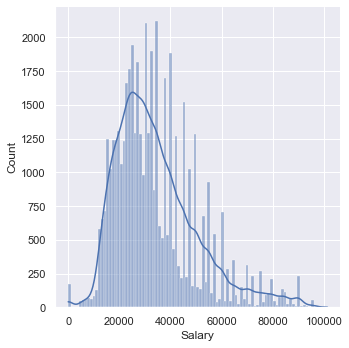

In [60]:
sns.displot(data=df, x="Salary",kde=True)

The ContractTime column has some missing data. Although, this column may reflect properties related to their sources in particular, so let's try and maintain that integrity, by keeping the same ratio of permanent to contract jobs.

In [61]:
df['ContractTime'].value_counts()

permanent        29561
non-specified    13525
contract          5344
Name: ContractTime, dtype: int64

In [62]:
df = df.copy()
df.shape[0]

48430

In [63]:
# Using similar code to the contracttype column correction above
df = df.sample(frac=1) # shuffle the rows
# This finds the ratio of contract positions to permanent, to use for the sample method
ratio = df[df['ContractTime']=='contract'].shape[0]/df[df['ContractTime']=='permanent'].shape[0] 

#the below code converts a certain ratio of the missing entries to contract
frac = df.query('ContractTime == \"non-specified\"').sample(frac=ratio).index,'ContractTime' 
df.loc[frac]='contract'
temp = df['ContractTime']=='non-specified'

#the remaining  becomes permanent
df['ContractTime'].replace('non-specified','permanent',inplace=True)

In [64]:
indices = df.index #We need to reset indices after dropping dataset values

In [65]:
#Update error list
new = pd.DataFrame(df.loc[frac])
new['ID'] = new.index
for ind in new['ID']:
    updateErlist(ind,'ContractTime','non-specified','contract','Missing value','imputed with an estimate value based on ratio from dataset')

applies_indices = indices[temp]
for ind in applies_indices:
    updateErlist(ind,'ContractTime','non-specified','permanent','Missing value','imputed with an estimate value based on ratio from dataset')


In [66]:
df.describe()

,Salary
count,48430.000000
mean,34357.023895
std,16004.393736
min,0.000000
25%,23000.000000
50%,31200.000000
75%,42500.000000
max,101378.000000


In [67]:
df.columns

Index(['Title', 'Location', 'Company', 'ContractType', 'ContractTime',
       'Category', 'Salary', 'OpenDate', 'CloseDate', 'SourceName'],
      dtype='object')

In [68]:
df[['OpenDate','CloseDate']]

,OpenDate,CloseDate
Id,,
68361039,20120130T120000,20120429T120000
68801651,20130406T000000,20130605T000000
68709495,20121125T150000,20130124T150000
69966949,20121009T150000,20121108T150000
72128822,20120223T000000,20120523T000000
...,...,...
71658437,20130326T150000,20130624T150000
71614350,20130925T150000,20131124T150000
64796571,20130724T000000,20130823T000000


In [69]:
i = 0
pattern = r'(\d{4})(\d{2})(\d{2})T(\d{2})(\d{2})(\d{2})'
condition = df['OpenDate'].str.contains(pattern,na=False)

applies_indices = indices[condition]

for ind,el in df[condition].iterrows():
    result = re.search(pattern,el['OpenDate'])
    date = str(result.group(1)) + '-' + result.group(2) + '-' + result.group(3) + ' ' + result.group(4) + ':' + result.group(5) + ':' + result.group(6)
    updateErlist(applies_indices[i],'OpenDate',df.loc[ind,'OpenDate'],date,'Improper value format',' '.join([str(j) for j in ['Replaced',str(df.loc[ind,'OpenDate']),'with correct date format',date]]))
    i += 1
    df.loc[ind,'OpenDate'] = date


C:\Users\priva\anaconda3\lib\site-packages\pandas\core\strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


In [70]:
i = 0
pattern = r'(\d{4})(\d{2})(\d{2})T(\d{2})(\d{2})(\d{2})'
condition = df['CloseDate'].str.contains(pattern,na=False)

applies_indices = indices[condition]

for ind,el in df[condition].iterrows():
    result = re.search(pattern,el['CloseDate'])
    date = str(result.group(1)) + '-' + result.group(2) + '-' + result.group(3) + ' ' + result.group(4) + ':' + result.group(5) + ':' + result.group(6)
    updateErlist(applies_indices[i],'CloseDate',df.loc[ind,'CloseDate'],date,'Improper value format',' '.join([str(j) for j in ['Replaced',str(df.loc[ind,'CloseDate']),'with correct date format',date]]))
    i += 1
    df.loc[ind,'CloseDate'] = date

C:\Users\priva\anaconda3\lib\site-packages\pandas\core\strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


KeyboardInterrupt: 

In [ ]:
df.head()

......

## Saving data

In [ ]:
# code to save output data
df.to_csv('s3906303_dataset1_solution.csv')
erlist.to_csv('s3906303_errorlist.csv')

## Summary
Give a short summary and anything you would like to talk about the assessment here.

Other than the Salary column, it should be fine for other columns to have missing data, such as the company attribute. Since we can't impute them, we just treat them as unknown information. Updating the errors dataframe also took a while for the computer, as there were so many corrections across all columns. This made for a harder debugging process.